# Fixed-width curvilinear Swath profile 

## At the beginning

Fixed-width curvilinear swath profile is equivalent to traditional swath profile that have been frequently used, which typically stacking a set of profile lines that are perpendicular to a baseline within a swath shape, or band, from which the elevation or other types of data (e.g., precipitation, relief, roughness, etc.) are sampled. Runing fixed-width swath analysis in PyOSP follows simple workflow. Here, we use a synthetic case to illustrate the implementation steps.

Figure below shows an artificial mountain range with a homogeneous width (90m) situated above the flat ground (0m). 

<img alt="homo_case" src="https://i.imgur.com/nSFSqxo.png" height="200"/>

As suggested by its name, the fixed-width swath analysis requires a defined width which is set as 100 m in order to encompass the cross width of the mountain (90 m). Additionally, the baseline is set across the longitudinal axis of the mountain. The following code shows the code snippet to generate a swath object.

## Generate a swath object

In [2]:
import pyosp

baseline = pyosp.datasets.get_path("homo_baseline.shp") # the path to baseline shapefile
raster = pyosp.datasets.get_path("homo_mount.tif")  # the path to raster file

orig = pyosp.Orig_curv(baseline, raster, width=100,
                       line_stepsize=3, cross_stepsize=None)


Processing: [#########################] 71 of 71 lineSteps

## Swath polygon and polylines

Now we can show relevant polygon and polylines to show swath area and profile lines

Text(0.5, 1.0, 'Swath profile lines')

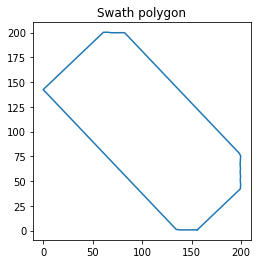

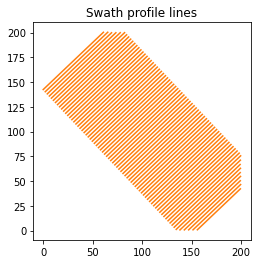

In [16]:
import matplotlib.pyplot as plt

# Plot the swath polygon
fig, ax = plt.subplots()
swath_polygon = orig.out_polygon()
px, py = swath_polygon.exterior.xy
ax.plot(px, py, label='swath polygon')
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath polygon")

# Plot the swath profile lines
fig, ax = plt.subplots()
swath_polylines = orig.out_polylines()
for line in swath_polylines:
    x, y = line.xy
    ax.plot(x, y, color='C1', zorder=1)

ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath profile lines")


Noticing that the polygon is generated by connecting ending points of polylines. In cases that polylines are heavily overlapping with each other, **the presented swath polygon could be less reliable**. Data is always sampled through the locations of polylines, rather than polygon.

Noticing as well that there are cutting conors around the swath area, we can verify that by plotting together with raster dataset.

(-10.0, 210.0)

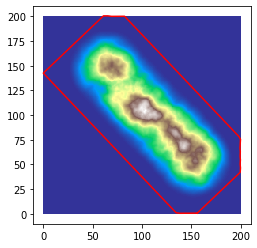

In [36]:
import numpy as np
import gdal

ds = gdal.Open(raster)
data = ds.ReadAsArray()
gt = ds.GetGeoTransform()

xRes = gt[1]
yRes = gt[5]

# get the edge coordinates and add half the resolution 
# to go to center coordinates
xmin = gt[0] + xRes * 0.5
xmax = gt[0] + (xRes * ds.RasterXSize) - xRes * 0.5
ymin = gt[3] + (yRes * ds.RasterYSize) + yRes * 0.5
ymax = gt[3] - yRes * 0.5

ds = None

# create a grid of xy coordinates 
xy = np.mgrid[xmin:xmax+xRes:xRes, ymax+yRes:ymin:yRes]

fig, ax = plt.subplots()
ax.plot(px, py, color="r", label='swath polygon')
ax.pcolormesh(xy[0], xy[1], data.T, cmap=plt.cm.terrain)
ax.set_aspect('equal', adjustable='box')
ax.set_xlim([-10, 210])
ax.set_ylim([-10, 210])


As shown above, the swath area was bounded by the range of raster dataset. PyOSP keeps detecting the boundary of dataset when it creates a swath object, to prevent the sampling going to no data area.

**PyOSP can also output generated polygon or polylines as shapefiles**, for example:

In [43]:
# Note it will generate polygon and polyline shapefiles in the current folder
pyosp.write_polygon(orig.out_polygon(), "./orig_polygon.shp")
pyosp.write_polygon(orig.out_polylines(), "./orig_polylines.shp")

## Swath profile

To plot the corresponding swath profile, simply run method:

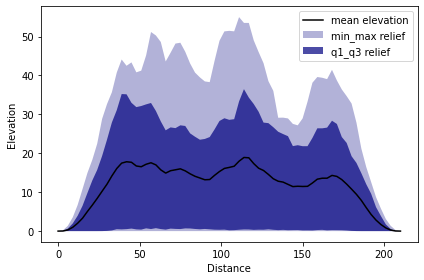

In [38]:
orig.profile_plot()

If it needs to be customized, an *axis* argument can be passed to the object:

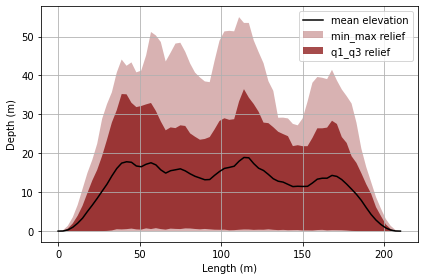

In [40]:
fig, ax = plt.subplots()
orig.profile_plot(ax=ax, color="maroon")
ax.set_xlabel("Length (m)")
ax.set_ylabel("Depth (m)")
ax.grid()


## End

This section covers the most basic usage of PyOSP to perform traditional fixed width swath profile. For more examples and advance topics, please refer to our *example gallery*.